In [1]:
print('hi')

hi


In [2]:
import torch.nn.functional as F
import torch.nn as nn
import torch
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
with open('./../names.txt', 'r') as f:
    name_list = f.read().splitlines()

In [115]:
chars = sorted(list(set("".join(name_list)))) + ['<e>', '<s>']
vocab_size = len(chars)

In [5]:
counts = {c:0 for c in chars}

for drug in name_list:
    for c in drug:
        counts[c] += 1

In [6]:
counts

{'a': 33885,
 'b': 2645,
 'c': 3532,
 'd': 5496,
 'e': 20423,
 'f': 905,
 'g': 1927,
 'h': 7616,
 'i': 17701,
 'j': 2900,
 'k': 5040,
 'l': 13958,
 'm': 6642,
 'n': 18327,
 'o': 7934,
 'p': 1026,
 'q': 272,
 'r': 12700,
 's': 8106,
 't': 5570,
 'u': 3135,
 'v': 2573,
 'w': 929,
 'x': 697,
 'y': 9776,
 'z': 2398,
 '<e>': 0,
 '<s>': 0}

In [7]:
vocab_size = len(chars)
tokenizer = dict(zip(chars, range(vocab_size)))
detokenizer = dict(zip(range(vocab_size), chars))

In [ ]:
# generating the dataset
context_length = 8
X = []
Y = []

for drug in name_list:
    context = ['<s>'] * context_length
    for i, c in enumerate(drug):
        context = context[1:] + [c]
        X.append([tokenizer[c] for c in context])
        if i < len(drug) - 1:
            Y.append(tokenizer[drug[i + 1]])
        else:
            Y.append(tokenizer["<e>"])

X = torch.tensor(X)
Y = torch.tensor(Y)

In [77]:
tst_idx = int(X.shape[0])
val_idx = int(tst_idx * 0.9)
tr_idx =  int(tst_idx * 0.8)

X_tr = X[0:tr_idx]
Y_tr = Y[0:tr_idx]

X_val = X[tr_idx:tst_idx]
Y_val = Y[tr_idx:tst_idx]

X_tst = X[val_idx:]
Y_tst = Y[val_idx:]

In [68]:
EMBEDDING_DIM = 10
HIDDEN_LAYER_1_SIZE = 70
HIDDEN_LAYER_2_SIZE = 30
LR = 1e-2

NUM_EPOCHS = 200000
BATCH_SIZE = 64


E = torch.randn(vocab_size, EMBEDDING_DIM)
W_1 = torch.randn(EMBEDDING_DIM * 2, HIDDEN_LAYER_1_SIZE) * (5/3) / (EMBEDDING_DIM * context_length) ** 0.5
B_1 = torch.randn(HIDDEN_LAYER_1_SIZE)  # Fixed: should match hidden layer size
BN_y = torch.ones(1)
BN_B = torch.zeros(1)

W_2 = torch.randn(HIDDEN_LAYER_1_SIZE * 2, HIDDEN_LAYER_2_SIZE) * (5/3) / (HIDDEN_LAYER_1_SIZE) ** 0.5
B_2 = torch.randn(HIDDEN_LAYER_2_SIZE)  # Fixed: should match hidden layer size
BN_y_2 = torch.ones(1)
BN_B_2 = torch.zeros(1)

W_3 = torch.randn(HIDDEN_LAYER_2_SIZE, vocab_size) * 0.01

parameters = [E, W_1, W_2, W_3, B_1, B_2, BN_y, BN_y_2, BN_B, BN_B_2]

# batch, 

for p in parameters:
    p.requires_grad = True

In [70]:
losses = []

for batch_num in range(NUM_EPOCHS):
    for p in parameters:
        p.grad = None

    batch_ix = torch.randint(0, X_tr.shape[0], (64,))


    xs = X_tr[batch_ix]
    y = Y_tr[batch_ix]

    emb = E[xs].view(BATCH_SIZE, -1, 2 * EMBEDDING_DIM)
    print('emb:', emb.shape)
    x = (emb @ W_1) + B_1

    print('l1:', x.shape)
    x = (BN_y * (x - x.mean(0, keepdim=True)) / x.std(0, keepdim=True)) + BN_B

    # plt.hist(x.detach().flatten().numpy())
    # plt.show()

    x = torch.tanh(x)

    # plt.hist(x.detach().flatten().numpy())
    # plt.show()
    x = x.view(BATCH_SIZE, x.shape[1]//2, -1)
    print("l2_pre:", x.shape)
    x = (x @ W_2) + B_2
    print("l2_post:", x.shape)
    x = (BN_y_2 * (x - x.mean(0, keepdim=True)) / x.std(0, keepdim=True)) + BN_B_2

    # plt.hist(x.detach().flatten().numpy())
    # plt.show()

    x = torch.tanh(x)

    # plt.hist(x.detach().flatten().numpy())
    # plt.show()
    logits = x @ W_3

    loss = torch.nn.functional.cross_entropy(logits, y)
    loss.backward()

    for p in parameters:
        p.data -= p.grad * LR

    losses.append(loss.item())

    

plt.plot(losses)


emb: torch.Size([64, 4, 20])
l1: torch.Size([64, 4, 70])
l2_pre: torch.Size([64, 2, 140])
l2_post: torch.Size([64, 2, 30])


RuntimeError: Expected target size [64, 28], got [64]

In [51]:
torch.cat((torch.tensor([[1,2],
                         [3,4]]), torch.tensor([[5,6],
                                                [7,8]])), dim=0)

tensor([[1, 2],
        [3, 4],
        [5, 6],
        [7, 8]])

In [12]:
losses = []

for batch_num in range(NUM_EPOCHS):
    for p in parameters:
        p.grad = None

    batch_ix = torch.randint(0, X_tr.shape[0], (64,))


    xs = X_tr[batch_ix]
    y = Y_tr[batch_ix]

    emb = E[xs].view(-1, EMBEDDING_DIM * context_length)

    x = (emb @ W_1) + B_1
    x = (BN_y * (x - x.mean(0, keepdim=True)) / x.std(0, keepdim=True)) + BN_B


    x = torch.tanh(x)


    x = (x @ W_2) + B_2
    x = (BN_y_2 * (x - x.mean(0, keepdim=True)) / x.std(0, keepdim=True)) + BN_B_2


    x = torch.tanh(x)

    logits = x @ W_3

    p = 
    loss.backward()

    for p in parameters:
        p.data -= p.grad * LR

    losses.append(loss.item())
    break

plt.plot(losses)


SyntaxError: invalid syntax (4261039691.py, line 30)

In [13]:
with torch.no_grad():
    xs = X_val
    y = Y_val

    emb = E[xs].view(-1, EMBEDDING_DIM * context_length)

    x = (emb @ W_1) + B_1

    bn_mean = x.mean(0, keepdim=True)
    bn_std = x.std(0, keepdim=True)
    x = (BN_y * (x - bn_mean) / bn_std) + BN_B

    x = torch.tanh(x)

    x = (x @ W_2) + B_2

    bn_mean_2 = x.mean(0, keepdim=True)
    bn_std_2 = x.std(0, keepdim=True)
    x = (BN_y_2 * (x - bn_mean_2) / bn_std_2) + BN_B_2

    x = torch.tanh(x)
    logits = x @ W_3

    loss = torch.nn.functional.cross_entropy(logits, y)

    print(loss.item())

3.3351142406463623


In [14]:
with torch.no_grad():
    xs = X_tr
    y = Y_tr

    emb = E[xs].view(-1, EMBEDDING_DIM * context_length)

    x = (emb @ W_1) + B_1

    bn_mean = x.mean(0, keepdim=True)
    bn_std = x.std(0, keepdim=True)
    x = (BN_y * (x - bn_mean) / bn_std) + BN_B

    x = torch.tanh(x)

    x = (x @ W_2) + B_2

    bn_mean_2 = x.mean(0, keepdim=True)
    bn_std_2 = x.std(0, keepdim=True)
    x = (BN_y_2 * (x - bn_mean_2) / bn_std_2) + BN_B_2

    x = torch.tanh(x)
    logits = x @ W_3

    loss = torch.nn.functional.cross_entropy(logits, y)

    print(loss.item())

3.3345305919647217


In [15]:
# INFER
samples = 10
context = [tokenizer['<s>']] * context_length

print(context)

with torch.no_grad():
    while context[-1] != tokenizer['<e>']:
        emb = E[torch.tensor(context[-6:]).unsqueeze(0)].view(-1, EMBEDDING_DIM * context_length)

        x = (emb @ W_1) + B_1

        x = (BN_y * (x - bn_mean) / bn_std) + BN_B

        x = torch.tanh(x)

        x = (x @ W_2) + B_2
        x = (BN_y_2 * (x - bn_mean_2) / bn_std_2) + BN_B_2

        x = torch.tanh(x)
        logits = x @ W_3

        prob = torch.exp(logits) / torch.exp(logits).sum()

        # plt.imshow(prob.detach().numpy())
        # plt.xticks(range(len(chars)), chars)
        # plt.show()

        sampled_token = torch.multinomial(prob, 1).item()

        context = context + [sampled_token]

    print("".join(map(lambda x: detokenizer[x], context[context_length:-1])))

[27, 27, 27, 27, 27, 27]
dqrrumbndxiga<s>xcpzwvfnuzegzl<s>mqil<s>mqfmwfkzq


In [16]:
torch.save({
    'E': E,
    'W_1': W_1,
    'B_1': B_1,
    'BN_y': BN_y,
    'BN_B': BN_B,
    'W_2': W_2,
    'B_2': B_2,
    'BN_y_2': BN_y_2,
    'BN_B_2': BN_B_2,
    'W_3': W_3,
    'chars': chars,
    'tokenizer': tokenizer,
    'detokenizer': detokenizer,
    'context_length': context_length,
    'embedding_dim': EMBEDDING_DIM,
    'bn_mean': bn_mean,
    'bn_std': bn_std,
    'bn_mean_2': bn_mean_2,
    'bn_std_2': bn_std_2
}, 'drugs_model.pt')

In [62]:
torch.tensor([[1,2,3],[3,4,5]]).shape[-1]

3

### in classes

In [99]:
class Linear():
    def __init__(self, in_features, out_features, bias=True, gain=5/3):
        W = torch.randn(in_features, out_features) * (gain / (in_features ** 0.5))
        B = torch.zeros(out_features)

        self.W = W
        self.bias = bias

        if bias:
            self.B = B

        for p in self.parameters():
            p.requires_grad = True

    def train(self):
        pass

    def test(self):
        pass

    def parameters(self):
        if self.bias:
            return [self.W, self.B]
        else:
            return [self.W]

    def __call__(self, x):
        for p in self.parameters():
            p.grad = None

        self.out = (x @ self.W) + self.B

        return self.out
    
    def step(self):
        for p in self.parameters():
            self.ud = p.grad * LR
            p.data -= self.ud
    

class BatchNorm():
    def __init__(self, num_features=None, eps=1e-05, momentum=0.1, track_running_stats=True):
        # TODO: check what is num_features for
        
        self.BN_y = torch.ones(1)
        self.BN_b = torch.zeros(1)

        self.BN_mean = None
        self.BN_var = None
        self.training = True

        self.momentum = momentum
        self.track_running_stats = track_running_stats
        self.eps = eps

        for p in self.parameters():
            p.requires_grad = True

    def parameters(self):
        return [self.BN_b, self.BN_y]

    def train(self):
        self.track_running_stats = True

    def test(self):
        self.track_running_stats = False

    def __call__(self, x: torch.Tensor):
        for p in self.parameters():
            p.grad = None

        curr_mean = None
        curr_var = None

        if self.track_running_stats:
            num_dims = len(x.shape)
            if num_dims == 3:
                dims = (0,1)
            elif num_dims == 2:
                dims = (0)
            mean = x.mean(dims, keepdim=True)
            var = x.var(dims, keepdim=True)
        
            if self.BN_mean is None:
                self.BN_mean = mean
            if self.BN_var is None:
                self.BN_var = var

            self.BN_mean = ((1 - self.momentum) * self.BN_mean) + (self.momentum * mean)
            self.BN_var = ((1 - self.momentum) * self.BN_var) + (self.momentum * var)

            curr_mean = mean
            curr_var = var
        else:
            curr_mean = self.BN_mean
            curr_var = self.BN_var

        self.out = self.BN_y * ((x - curr_mean) / (curr_var + self.eps) ** 0.5) + self.BN_b

        return self.out
    
    def step(self):
        for p in self.parameters():
            p.data -= p.grad * LR
    

class Tanh():
    def __init__(self):
        pass

    def __call__(self, x):
        self.out = torch.tanh(x)

        return self.out
    
    def parameters(self):
        return []
    
    def train(self):
        pass

    def test(self):
        pass
    
    def step(self):
        pass

class Embedding():
    def __init__(self, num_embeddings, embedding_dim):
        self.emb_dim = embedding_dim
        self.num_embeddings = num_embeddings

        self.emb = torch.randn(self.num_embeddings, self.emb_dim)

        for p in self.parameters():
            p.requires_grad = True
        
    def __call__(self, x):
        self.out = self.emb[x]
        return self.out
    
    def parameters(self):
        return [self.emb]
    
    def step(self):
        pass

    def train(self):
        pass

    def test(self):
        pass
    
class Flatten():
    def __init__(self):
        pass

    def __call__(self, x):
        self.out = x.view(x.shape[0], -1)
        return self.out
    
    def parameters(self):
        return []
    
    def step(self):
        pass

    def train(self):
        pass

    def test(self):
        pass

class InitMerge():
    def __init__(self):
        pass

    def __call__(self, x):
        self.out = x.view(x.shape[0], -1,  2 * x.shape[-1])
        return self.out
    
    def parameters(self):
        return []
    
    def step(self):
        pass

    def train(self):
        pass

    def test(self):
        pass

class Merge():
    def __init__(self):
        pass

    def __call__(self, x):
        x = x.view(x.shape[0], x.shape[1] // 2,  -1)

        if x.shape[1] == 1:
            x = x.view(x.shape[0], -1)

        self.out = x
        return self.out
    
    def parameters(self):
        return []
    
    def step(self):
        pass

    def train(self):
        pass

    def test(self):
        pass
    
class Sequential():
    def __init__(self, layers):
        self.layers = layers

    def __call__(self, x):
        for l in self.layers:
            x = l(x)

        self.out = x

        return self.out
    
    def step(self):
        for l in self.layers:
            l.step()

    def parameters(self):
        params = []
        for l in self.layers:
            params += l.parameters()
        return params
    
    def train(self):
        pass

    def test(self):
        pass
            


In [84]:
EMBEDDING_DIM = 8
HIDDEN_LAYER_1_SIZE = 70
HIDDEN_LAYER_2_SIZE = 30
LR = 1e-3

NUM_EPOCHS = 200000
BATCH_SIZE = 64


E = Embedding(vocab_size, EMBEDDING_DIM)


model = Sequential([
    Embedding(vocab_size, EMBEDDING_DIM),
    Flatten(),
    Linear(EMBEDDING_DIM * context_length, HIDDEN_LAYER_1_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Linear(HIDDEN_LAYER_1_SIZE, HIDDEN_LAYER_2_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Linear(HIDDEN_LAYER_2_SIZE, HIDDEN_LAYER_2_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Linear(HIDDEN_LAYER_2_SIZE, HIDDEN_LAYER_2_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Linear(HIDDEN_LAYER_2_SIZE, vocab_size, gain=1)
])


losses = []
ud = []

for batch_num in range(NUM_EPOCHS):
    batch_ix = torch.randint(0, X_tr.shape[0], (64,))

    x = X_tr[batch_ix]
    y = Y_tr[batch_ix]

    x = model(x)

    loss = torch.nn.functional.cross_entropy(x, y)
    loss.backward()
    model.step()
    losses.append(loss.item())

plt.plot(torch.tensor(losses).view(-1, 100).mean(1))



torch.Size([64, 8, 10])
torch.Size([64, 4, 20])
torch.Size([64, 4, 70])
torch.Size([64, 4, 70])
torch.Size([64, 4, 70])
torch.Size([64, 2, 140])
torch.Size([64, 2, 30])
torch.Size([64, 2, 30])
torch.Size([64, 2, 30])
torch.Size([64, 1, 60])
torch.Size([64, 1, 30])
torch.Size([64, 1, 30])
torch.Size([64, 1, 30])
torch.Size([64, 30])
torch.Size([64, 28])
torch.Size([64, 8, 10])
torch.Size([64, 4, 20])
torch.Size([64, 4, 70])
torch.Size([64, 4, 70])
torch.Size([64, 4, 70])
torch.Size([64, 2, 140])
torch.Size([64, 2, 30])
torch.Size([64, 2, 30])
torch.Size([64, 2, 30])
torch.Size([64, 1, 60])
torch.Size([64, 1, 30])
torch.Size([64, 1, 30])
torch.Size([64, 1, 30])
torch.Size([64, 30])
torch.Size([64, 28])
torch.Size([64, 8, 10])
torch.Size([64, 4, 20])
torch.Size([64, 4, 70])
torch.Size([64, 4, 70])
torch.Size([64, 4, 70])
torch.Size([64, 2, 140])
torch.Size([64, 2, 30])
torch.Size([64, 2, 30])
torch.Size([64, 2, 30])
torch.Size([64, 1, 60])
torch.Size([64, 1, 30])
torch.Size([64, 1, 30])
t

KeyboardInterrupt: 

In [19]:
model_size = sum(len(l) for l in model.parameters())
model_size

432

In [20]:
torch.tensor(context[-6:]).unsqueeze(0).shape

torch.Size([1, 6])

In [32]:
# INFERENCE

samples = 10
context = [tokenizer['<s>']] * context_length

print(context)

with torch.no_grad():
    for l in model.layers:
        l.test()
    while context[-1] != tokenizer['<e>']:
        x = torch.tensor(context[-6:]).unsqueeze(0)
        logits = model(x)
        prob = torch.exp(logits) / torch.exp(logits).sum()
        sampled_token = torch.multinomial(prob, 1).item()

        context = context + [sampled_token]

    print("".join(map(lambda x: detokenizer[x], context[context_length:-1])))

[27, 27, 27, 27, 27, 27]
hofnnn


In [ ]:
model.layers[3].BN_mean

tensor([[-1.4246, -0.8176,  0.5742, -1.1826,  0.1329,  1.0911,  0.1722, -1.0295,
          0.8037, -0.5201,  0.3658,  0.7110, -0.0176,  1.1643,  1.8221, -0.7729,
         -0.1274,  0.3341,  0.8637,  1.4322, -0.6049, -0.2379, -1.2374, -1.3532,
          0.3969,  0.9215, -1.3575, -0.5114, -0.4984, -0.4767, -0.5184, -0.0662,
         -0.8971,  1.5577,  0.5450, -0.8703,  0.1348, -0.4895, -2.3874,  1.6169,
          0.1507, -0.8937, -0.4692,  1.5442, -1.2188, -0.4456,  0.5450, -0.2246,
         -0.9287, -2.0033,  0.5778, -2.2225, -0.8095,  2.0562, -1.1727,  0.6212,
          0.0943,  1.8301,  1.2288,  0.8738,  1.1279,  0.7029,  3.5934, -1.0623,
         -0.7153, -0.2559, -0.9764, -0.5644,  0.4203, -0.1250]],
       grad_fn=<AddBackward0>)

# Wavenet

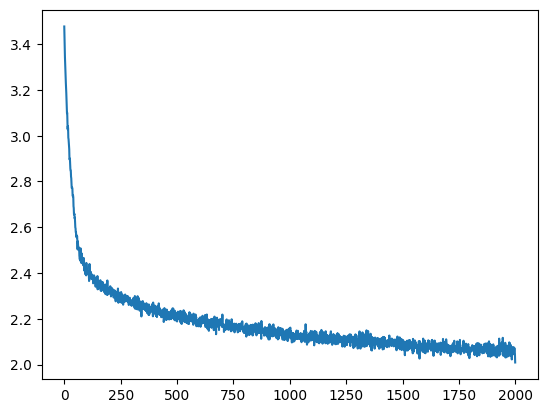

In [100]:
EMBEDDING_DIM = 10
HIDDEN_LAYER_1_SIZE = 70
HIDDEN_LAYER_2_SIZE = 30
LR = 1e-3

NUM_EPOCHS = 200000
BATCH_SIZE = 64


E = Embedding(vocab_size, EMBEDDING_DIM)


model = Sequential([
    Embedding(vocab_size, EMBEDDING_DIM),
    Linear(EMBEDDING_DIM, HIDDEN_LAYER_1_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Merge(),
    Linear(HIDDEN_LAYER_1_SIZE * 2, HIDDEN_LAYER_2_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Merge(),
    Linear(HIDDEN_LAYER_2_SIZE * 2, HIDDEN_LAYER_2_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Merge(),
    Linear(HIDDEN_LAYER_2_SIZE * 2, HIDDEN_LAYER_2_SIZE, bias=True),
    BatchNorm(),
    Tanh(),
    Linear(HIDDEN_LAYER_2_SIZE, vocab_size, gain=1)
])


losses = []
ud = []

for batch_num in range(NUM_EPOCHS):
    batch_ix = torch.randint(0, X_tr.shape[0], (64,))

    x = X_tr[batch_ix]
    y = Y_tr[batch_ix]

    x = model(x)

    loss = torch.nn.functional.cross_entropy(x, y)
    loss.backward()
    model.step()
    losses.append(loss.item())
    # break

plt.plot(torch.tensor(losses).view(-1, 100).mean(1))



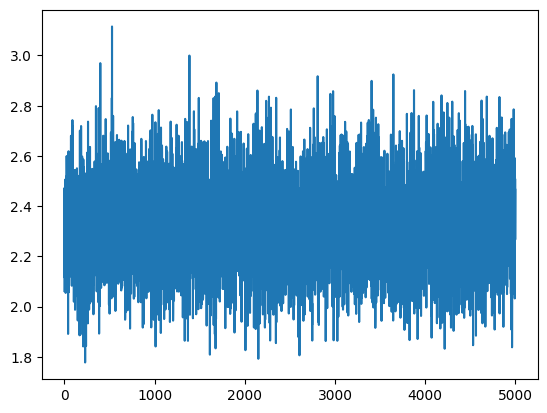

In [113]:
val_losses = []

with torch.no_grad():
    for batch_num in range(5000):
        batch_ix = torch.randint(0, X_val.shape[0], (64,))

        x = X_val[batch_ix]
        y = Y_val[batch_ix]

        x = model(x)

        loss = torch.nn.functional.cross_entropy(x, y)
        val_losses.append(loss.item())
        # break

plt.plot(torch.tensor(val_losses))

In [114]:
train_loss = torch.tensor(losses).reshape(-1, 100)[-1].mean()
val_loss = torch.tensor(val_losses).reshape(-1,100)[-1].mean()
print(f"train loss: {train_loss.item():3f}")
print(f"val loss: {val_loss.item():3f}")


train loss: 2.009077
val loss: 2.338547


In [93]:
losses = []
ud = []

for batch_num in range(NUM_EPOCHS):
    batch_ix = torch.randint(0, X_tr.shape[0], (64,))

    x = X_tr[batch_ix]
    y = Y_tr[batch_ix]

    x = model(x)

    loss = torch.nn.functional.cross_entropy(x, y)
    loss.backward()
    model.step()
    losses.append(loss.item())
    # break

KeyboardInterrupt: 

In [98]:
torch.randn(2,3,4).mean(dim=0, keepdim=True).shape

torch.Size([1, 3, 4])